In [1]:
import scipy as sp
from scipy import signal
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import scipy.io as sio
from scipy.interpolate import interp1d
import math
from scipy import stats
import glob
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC 
import shutil
import os
from sklearn.metrics import roc_auc_score
from matplotlib.patches import Ellipse

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pylab as pylab
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (10, 4),
         'axes.labelsize': 'large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'large',
         'ytick.labelsize':'large'}
pylab.rcParams.update(params)

# Load data and setup

In [2]:
from analysis_functions import *
from plotting_functions import *

### Define parameters

In [3]:
monkey = 'Stanton'

In [4]:
# PATHS
datapath = 'E:\\two_boundary\\original_data\\'
figpath = 'E:\\two_boundary\\figures\\'
datapathsave = 'E:\\two_boundary\\data\\'

brain_areas = ['MT', 'MST', 'LIP', 'SC']

# BRAIN AREAS
#if monkey == 'Neville':
#    brain_areas = ['MT', 'MST', 'LIP']
#else:
#    brain_areas = ['MST', 'LIP']

# BINNING/SMOOTHING PARAMETERS
bins = np.arange(-300, TEST1)
sm_std = 30 # gaussian smoothing stdev
bin_size = 100 # msec for binend data

# MIN NUM TRIALS FOR INCLUSION
min_ntrials = 5

# MIN NEURON RATING FOR INCLUSION
min_rating = 2.5

In [5]:
neural_decoder

NameError: name 'neural_decoder' is not defined

In [6]:
neural_decoder = sio.loadmat('E:\\two_boundary\\figures\\SC_analysis\\category_decoding\\'+ monkey + '_cat_decoder_count_matched.mat')['cat_decoder_all']['SC'][0][0][0]

## PSTH

In [311]:
neural_decoder = sio.loadmat('E:\\two_boundary\\figures\\eye_movements\\'+'neural_cat_decoder_NEVILLE.mat')['cat_decoder_all']['LIP'][0][0][0]['decoder_mean'][0][0]

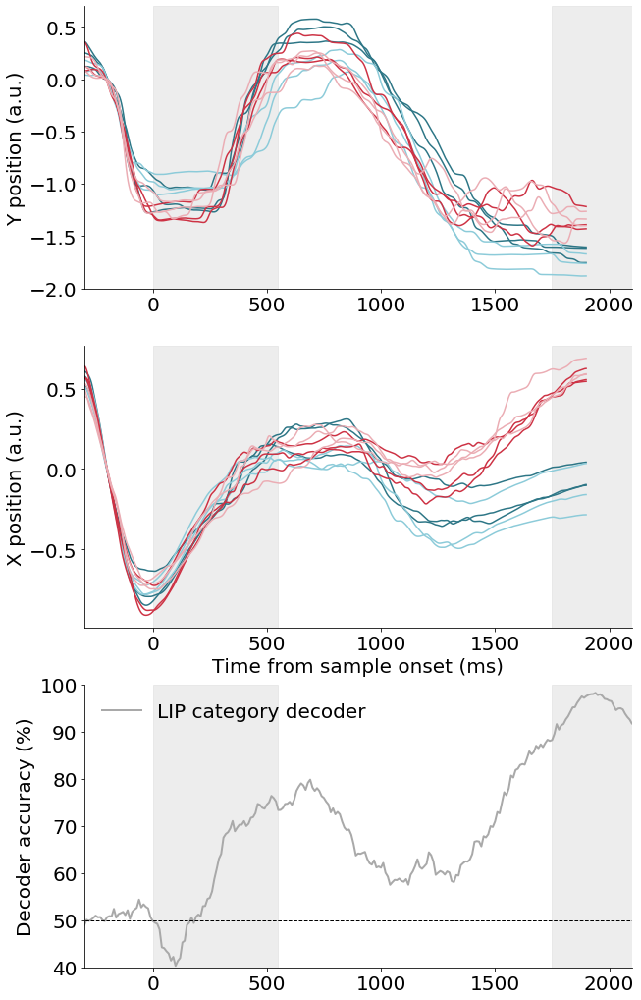

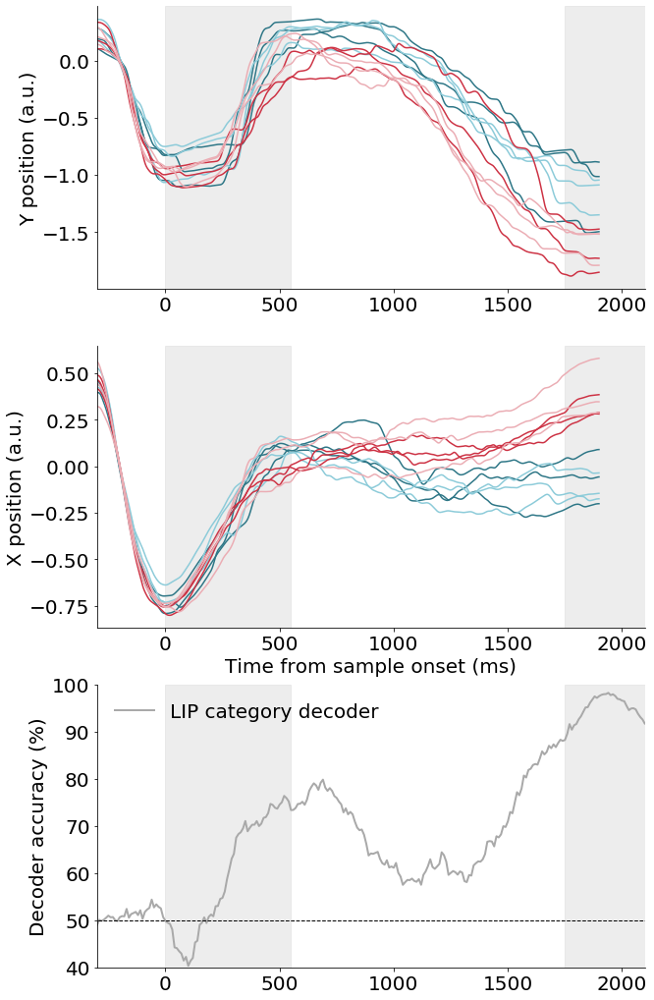

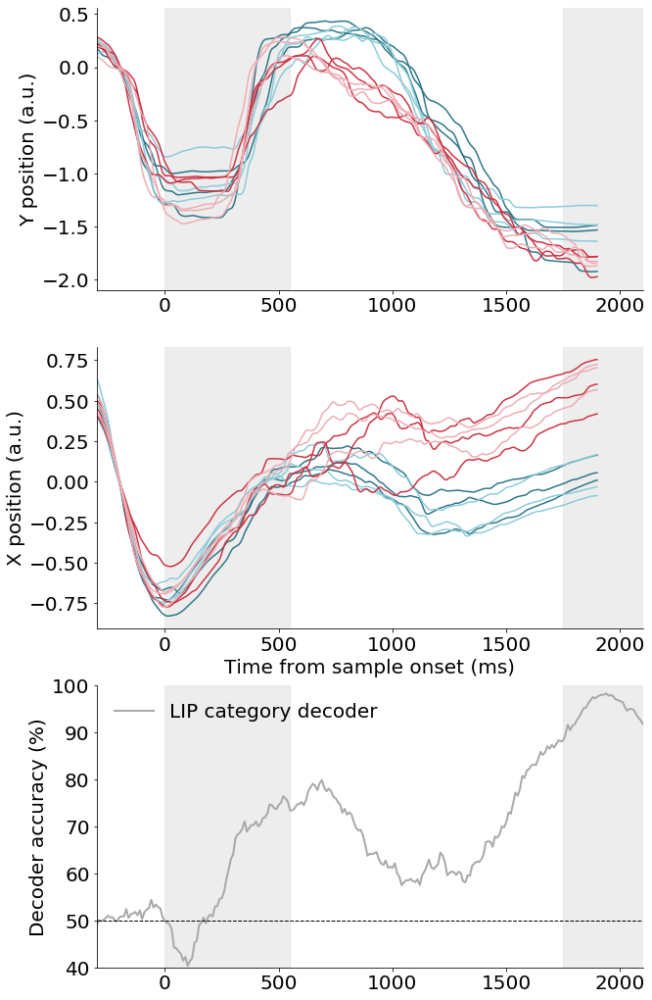

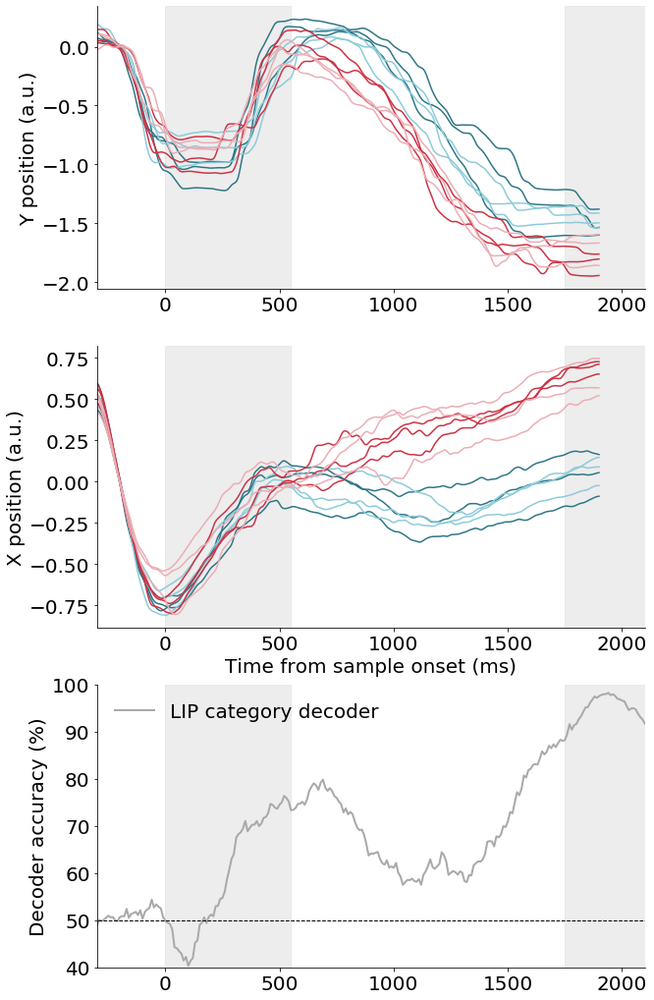

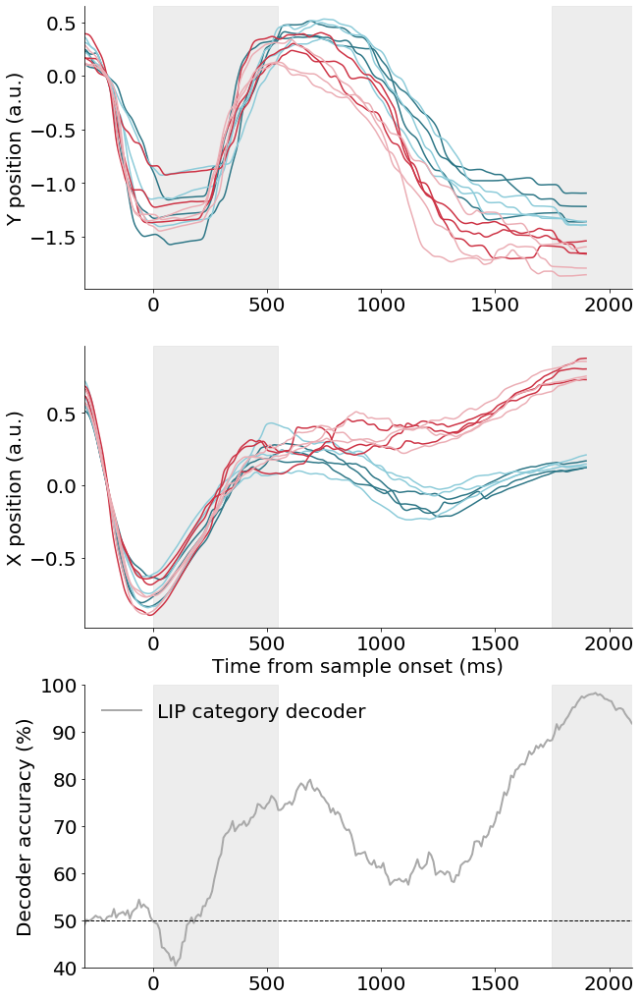

...

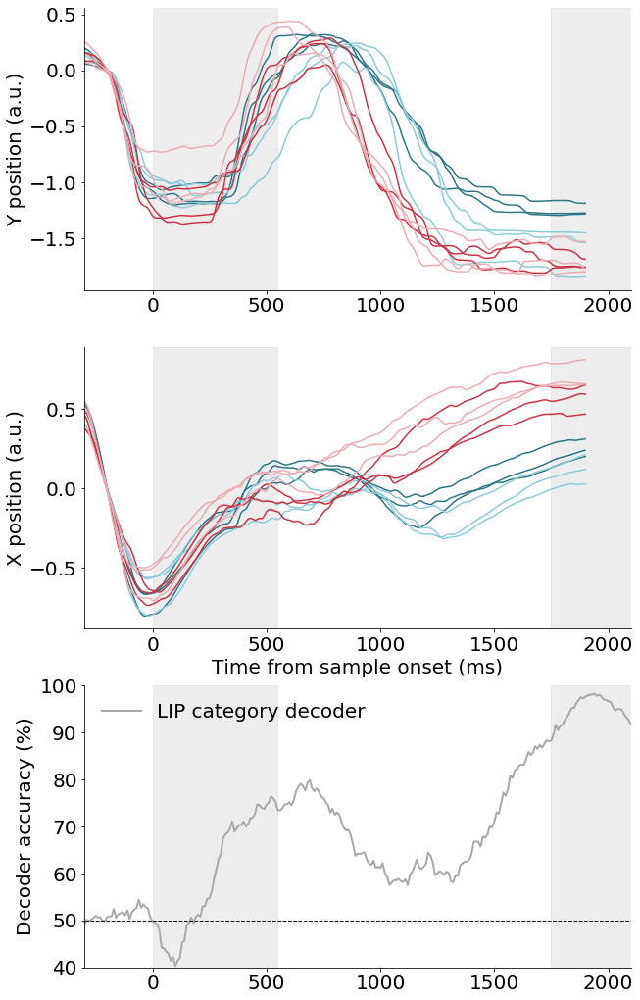

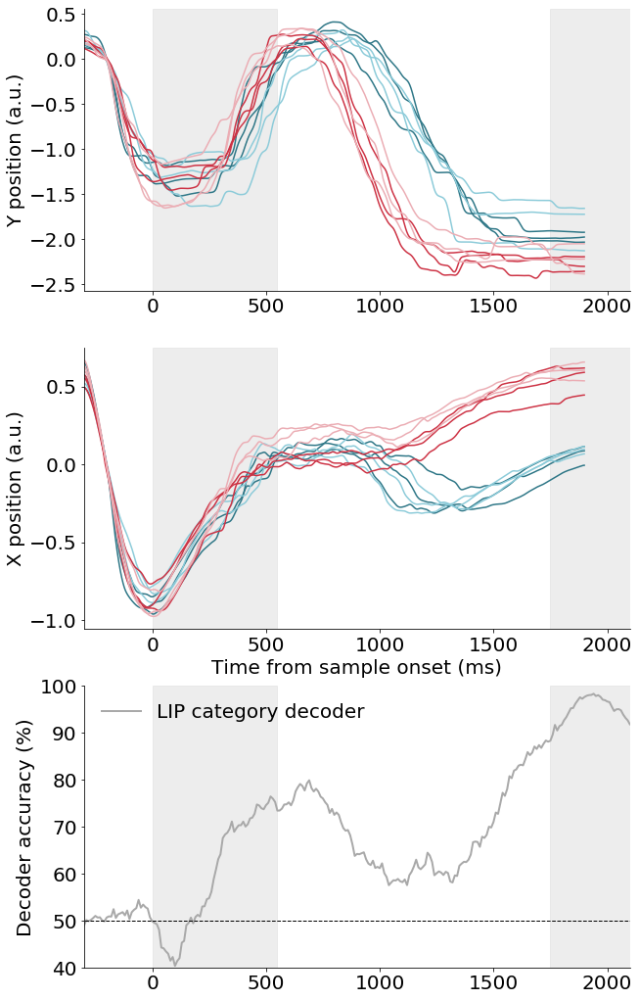

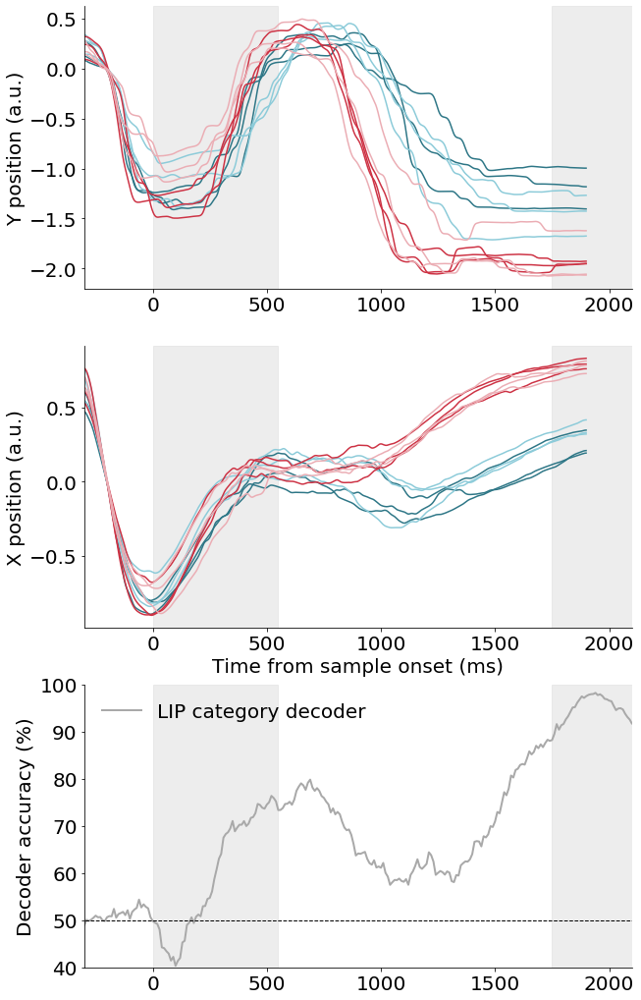

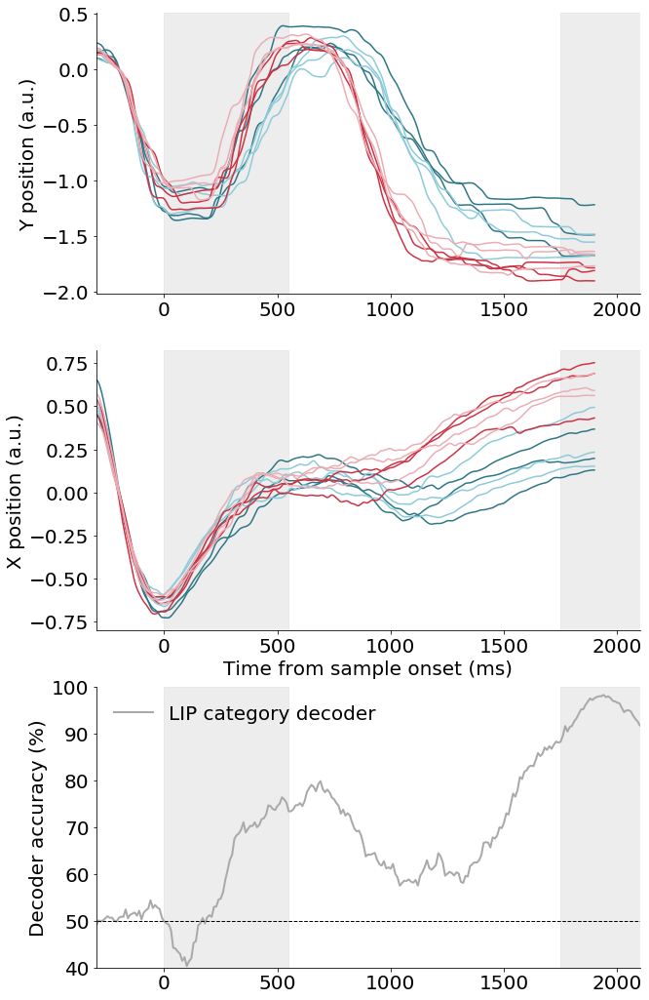

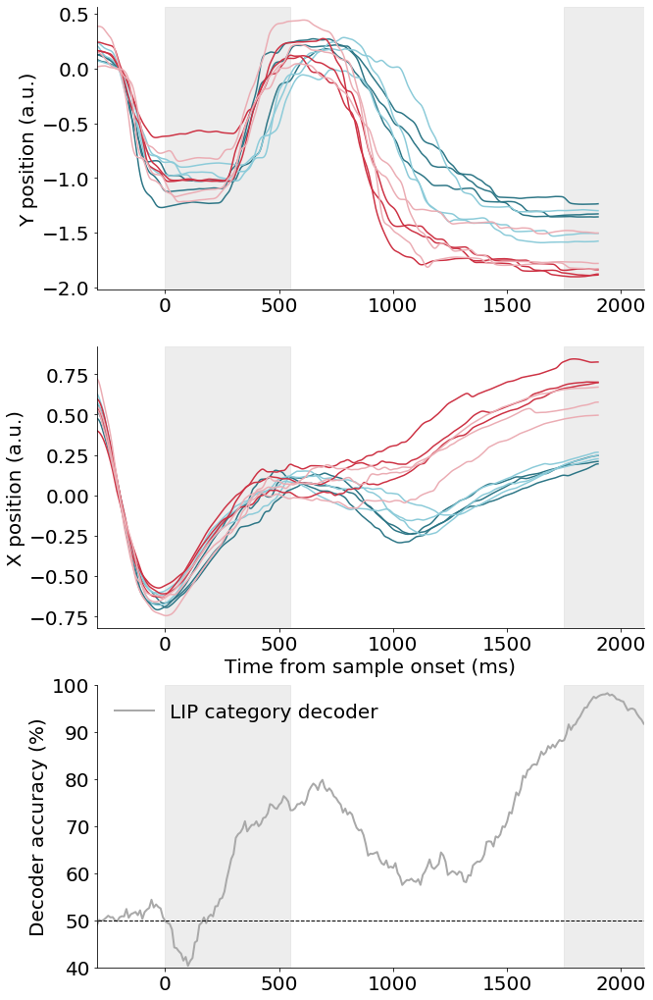

In [313]:
all_data = {}

for area in brain_areas:
    
    trials_per_dir_all = {}
    
    currpath = datapath + monkey + '\\' + area
    os.chdir(currpath)
    
    filelist = [f for f in glob.glob("*merged_w_ratings.mat")]
    n_files = len(filelist)
    
    # Pre-allocate
    all_ratings = []
    mean_firing_rates = []

    # Loop over files (datasets)
    for file in filelist:
        bhv = sio.loadmat(file)['data']['BHV'] # data from monkeylogic bhv files
        neuro = sio.loadmat(file)['data']['NEURO'] # data from neural nex file   

        date = file[8:18] # date of recording session
        
        
        if 0 < 1:
        #if 'eye1' in neuro[0][0][0][0].dtype.names:
        
            conditions = bhv[0][0][0][0][3][0] # list of conditions per trial
            errors = bhv[0][0][0][0]['TrialError'] # list of errors per trial
            code_times = [i[0] for i in neuro[0][0][0][0][2]] # list of code times for each trial
            code_numbers = [i[0] for i in neuro[0][0][0][0][3]] # list of code numbers for each trial

            trial_starts = [i for i, val in enumerate(code_numbers) if val == STRT_TRIAL]
            #eye1 = [i[0] for i in neuro[0][0][0][0]['eye1']]
            #eye2 = [i[0] for i in neuro[0][0][0][0]['eye2']]        

            eye1_by_trial = [[] for i in range(N_DIRS)]
            eye2_by_trial = [[] for i in range(N_DIRS)]

            n_trials = len(conditions)

            for i_trial in range(n_trials):

                    condition_num = conditions[i_trial]
                    dir_num = int(np.ceil(condition_num/6))-1
                    cat_num = int(np.floor(condition_num/37))

                    trial_start_indx = trial_starts[i_trial]
                    trial_start_time = code_times[trial_start_indx]

                    if condition_num < 73 and errors[i_trial] == 0 and condition_num != PV_COND and code_numbers[trial_start_indx+1] != MS_STIM_ON and code_numbers[trial_start_indx+1] != 1:

                        
                        '''
                        if i_trial != n_trials-1:
                            samp_on_indx = [i+trial_start_indx for i, val in enumerate(code_numbers[trial_start_indx:trial_starts[i_trial+1]]) if val == SAMP_ON][0]
                        else:
                            samp_on_indx = [i+trial_start_indx for i, val in enumerate(code_numbers[trial_start_indx:]) if val == SAMP_ON][0]
                        samp_on_time = code_times[samp_on_indx]


                        e1 = eye1[samp_on_time-300:samp_on_time+TEST1]
                        e2 = eye2[samp_on_time-300:samp_on_time+TEST1]
                        
                        '''
                        samp_on_indx = np.where(bhv[0][0][0][0]['CodeNumbers'][0][i_trial] == STIM_ON)[0][0]
                        samp_on_time = int(np.floor(bhv[0][0][0][0]['CodeTimes'][0][i_trial][samp_on_indx]))

                        eye1 = [i[0] for i in bhv[0][0][0][0]['AnalogData'][0]['EyeSignal'][i_trial]]
                        eye2 = [i[1] for i in bhv[0][0][0][0]['AnalogData'][0]['EyeSignal'][i_trial]]

                        e1 = eye1[samp_on_time-300:samp_on_time+TEST1-400]
                        e2 = eye2[samp_on_time-300:samp_on_time+TEST1-400]

                        e1 = [i-e1[100] for i in e1]
                        e2 = [i-e2[100] for i in e2]

                        eye1_by_trial[dir_num].append(e1)#np.convolve(e1, np.ones(100), 'same'))
                        eye2_by_trial[dir_num].append(e2)#np.convolve(e2, np.ones(100), 'same'))


            e1_means = [gaussian_filter1d(np.mean(i, 0), 10) for i in eye1_by_trial if len(i) > 0]
            e2_means = [gaussian_filter1d(np.mean(i, 0), 10) for i in eye2_by_trial if len(i) > 0]
            #e1_means = [(np.mean(i, 0)) for i in eye1_by_trial if len(i) > 0]
            #e2_means = [(np.mean(i, 0)) for i in eye2_by_trial if len(i) > 0]
            
            e1_sem = [gaussian_filter1d(sp.stats.sem(i, 0), 10) for i in eye1_by_trial if len(i) > 0]
            e2_sem = [gaussian_filter1d(sp.stats.sem(i, 0), 10) for i in eye2_by_trial if len(i) > 0]
            
            
            dmc_trial1 = np.intersect1d(np.where(conditions != 73)[0], np.where(errors == 0)[0])[0]
            h_pos = round(bhv[0][0][0][0]['ObjectStatusRecord']['Position'][0][dmc_trial1][3][0][1][0], 1)
            v_pos = round(bhv[0][0][0][0]['ObjectStatusRecord']['Position'][0][dmc_trial1][3][0][1][1], 1)
            
            
            #current_key = 'h_pos_{}_v_pos_{}'.format(h_pos, v_pos)
            
            #if current_key == 'h_pos_-7.5_v_pos_0.0' or current_key == 'h_pos_-4.6_v_pos_-4.6' or current_key == 'h_pos_-4.6_v_pos_4.6':
            
            
            if v_pos < -3:
                current_key = 'theta_210'
            elif v_pos > 3:
                current_key = 'theta_150'
            else:
                current_key = 'theta_180'
                
                
            if current_key in all_data:
                all_data[current_key]['eye1'] = np.vstack([all_data[current_key]['eye1'], eye1_by_trial])
                all_data[current_key]['eye2'] = np.vstack([all_data[current_key]['eye2'], eye2_by_trial])
            else:
                 all_data[current_key] = {'eye1': eye1_by_trial, 'eye2': eye2_by_trial}
                
            '''

            n_iter = 50
            decoder_type = 'cat'

            timepoints = np.arange(0, len(bins))

            all_data = np.vstack([eye1_by_trial, eye2_by_trial])
            n_neurons_decoder = 2
            n_neurons_total = 2
            n_trials_per_dir = 10
            equal_n_per_dir = False

            clf = SVC(kernel='linear')

            timepoints = bins

            # Run decoder every 10ms
            n_timepoints = len(timepoints)-1
            decoder_timepoints = np.arange(0, n_timepoints, 10)

            # Number trials per class (category)
            n_dirs_per_class = 3
            n_trials_train = n_trials_per_dir*n_dirs_per_class

            # Define quadrants for training/testing (4 possible combinations)
            all_configs = {}
            all_configs['train_data_c1'] = [[0, 1, 2], [3, 4, 5], [0, 1, 2], [3, 4, 5]]
            all_configs['train_data_c2'] = [[6, 7, 8], [9, 10, 11], [9, 10, 11], [6, 7, 8]]
            all_configs['test_data_c1'] = [[3, 4, 5], [0, 1, 2], [3, 4, 5], [0, 1, 2]]
            all_configs['test_data_c2'] = [[9, 10, 11], [6, 7, 8], [6, 7, 8], [9, 10, 11]]
            groups = ['train_data_c1', 'train_data_c2', 'test_data_c1', 'test_data_c2']

            # Pre-allocate to save decoder performance
            perf_all = np.zeros([n_iter, len(decoder_timepoints)])

            for iteration in range(0, n_iter):

                # Choose subset of neurons (if sub-sampling)
                neurons = np.random.choice(n_neurons_total, n_neurons_decoder, replace=False)

                # Choose a train-test config
                indx = np.random.randint(0, 4)
                curr_config = {}
                for ii, group in enumerate(groups):
                    curr_config[group] = all_configs[group][indx]

                # Pre-allocate training and testing arrays
                svm_data = {}
                for group in groups:
                    svm_data[group] = [np.zeros([n_neurons_decoder, n_trials_train]) for i in range(n_timepoints)]

                for i_neuron, neuron in enumerate(neurons):
                    data = all_data[neuron]

                     # Organize neuron's data by category and training/testing trials
                    for group in groups:

                        if equal_n_per_dir:
                            min_nt = min([len(i) for i in [data[curr_config[group][0]], data[curr_config[group][1]], data[curr_config[group][2]]]])

                            if min_nt >= n_trials_per_dir:
                                inds = np.vstack([np.random.choice(len(data[ii]), n_trials_per_dir, replace= False) for ii in curr_config[group]])
                            else:
                                inds = np.vstack([np.random.choice(len(data[i]), n_trials_per_dir, replace= False) if len(data[i]) >= n_trials_per_dir else np.random.choice(len(data[i]), n_trials_per_dir, replace= True) for i in curr_config[group]])

                            X = np.vstack([data[val][inds[i]] for i, val in enumerate(curr_config[group])])

                        else:
                            curr_data = np.vstack([data[curr_config[group][0]], data[curr_config[group][1]], data[curr_config[group][2]]])
                            X, Xt, y, yt = train_test_split(curr_data, np.zeros([len(curr_data)]), train_size = n_trials_train)

                        if n_timepoints == 1:
                            svm_data[group][0][i_neuron][:] = np.hstack(X)
                        else:
                            for ii in range(n_timepoints):
                                svm_data[group][ii][i_neuron][:] = X[:, ii]

                # Run decoder
                perf = np.ones([len(decoder_timepoints)])

                for i_timepoint, timepoint in enumerate(decoder_timepoints):

                    x_train = np.hstack([svm_data['train_data_c1'][timepoint], svm_data['train_data_c2'][timepoint]])
                    y_train = np.hstack([np.zeros([n_trials_train]), np.ones([n_trials_train])])

                    x_test = np.hstack([svm_data['test_data_c1'][timepoint], svm_data['test_data_c2'][timepoint]])
                    y_test = np.hstack([np.zeros([n_trials_train]), np.ones([n_trials_train])])

                    clf.fit(x_train.T, y_train)

                    pred = clf.predict(x_test.T)
                    perf[i_timepoint] = sum(pred == y_test)/len(y_test)*100

                perf_all[iteration] = perf



            savepath = 'E:\\two_boundary\\figures\\eye_movements\\' + monkey + '_' + file[8:18] + '_decoder.mat'
            sp.io.savemat(savepath, {'perf_all': perf_all})
            '''

            fig, ax =  plt.subplots(3, 1, figsize=(10, 18))

            for i in range(0, 3):
                ax[0].plot(range(-300, TEST1-400), e1_means[i], '#2d7686')
                #ax[0].fill_between(range(-300, TEST1-200), e1_means[i]-e1_sem[i], e1_means[i]+e1_sem[i], color = '#2d7686', lw = 1., alpha = 0.5, zorder=20)
                ax[1].plot(range(-300, TEST1-400), e2_means[i], '#2d7686')

            for i in range(3, 6):
                ax[0].plot(range(-300, TEST1-400), e1_means[i], '#8ccbd9')
                #ax[0].fill_between(range(-300, TEST1-200), e1_means[i]-e1_sem[i], e1_means[i]+e1_sem[i], color = '#8ccbd9', lw = 1., alpha = 0.5, zorder=20)
                ax[1].plot(range(-300, TEST1-400), e2_means[i], '#8ccbd9')

            for i in range(6, 9):
                ax[0].plot(range(-300, TEST1-400), e1_means[i], '#cd3244')
                #ax[0].fill_between(range(-300, TEST1-200), e1_means[i]-e1_sem[i], e1_means[i]+e1_sem[i], color = '#cd3244', lw = 1., alpha = 0.5, zorder=20)
                ax[1].plot(range(-300, TEST1-400), e2_means[i], '#cd3244')

            for i in range(9, 12):
                ax[0].plot(range(-300, TEST1-400), e1_means[i], color = '#ebadb4')
                #ax[0].fill_between(range(-300, TEST1-200), e1_means[i]-e1_sem[i], e1_means[i]+e1_sem[i], color = '#ebadb4', lw = 1., alpha = 0.5, zorder=20)
                ax[1].plot(range(-300, TEST1-400), e2_means[i], color = '#ebadb4')    

            #ax[0].set_title('Y position', fontsize = 25, fontweight='bold')
            #ax[1].set_title('X position', fontsize = 25, fontweight='bold')
            ax[0].set_ylabel('Y position (a.u.)', fontsize = 20)
            ax[1].set_ylabel('X position (a.u.)', fontsize = 20)


            #ax[2].plot(np.arange(-300, TEST1, 10), np.mean(perf_all[0:40], 0), color = 'darkslategrey', lw = 2, label = 'Eye position category decoder')
            ax[2].plot(np.arange(-500, 3050, 10), neural_decoder, 'darkgray', lw = 2, label = 'LIP category decoder')
            ax[2].legend(frameon = False, fontsize = 20)
            ax[2].plot([-500, 3050], [50, 50], '--k', lw = 1)


            for i in range(3):
                ax[i].set_xlim((-300, TEST1-200))

                ax[1].set_xlabel('Time from sample onset (ms)', fontsize = 20)

                ax[i].axvspan(0, TRIAL_EPOCHS[0], alpha = 0.4, color = 'lightgrey', zorder=1)
                ax[i].axvspan(TRIAL_EPOCHS[1], TRIAL_EPOCHS[2], alpha = 0.4, color = 'lightgrey', zorder=2)


                # Hide the right and top spines
                ax[i].spines['right'].set_visible(False)
                ax[i].spines['top'].set_visible(False)

                ax[i].tick_params(labelsize=20)

            ax[2].set_ylabel('Decoder accuracy (%)', fontsize = 20)
            ax[2].set_ylim(40, 100)
                   
            savepath = figpath + 'eye_movements\\' + monkey + '\\' + 'h_pos_{}_v_pos_{}'.format(h_pos, v_pos)
            make_dirs(savepath)

            for i in save_filetype:
                savename = savepath + '\\' + file[8:18] + '_from_bhv.' + i
                fig.savefig(savename, bbox_inches='tight')


In [296]:
[len(i) for i in eye1_by_trial]

[24, 26, 29, 25, 25, 30, 31, 32, 25, 23, 36, 22]

In [330]:

for i_trial in range(2, 3):

        condition_num = conditions[i_trial]-1
        dir_num = int(np.ceil(condition_num/6))-1
        cat_num = int(np.floor(condition_num/37))

        trial_start_indx = trial_starts[i_trial]
        trial_start_time = code_times[trial_start_indx]

        if condition_num < 73 and errors[i_trial] == 0 and condition_num != PV_COND and code_numbers[trial_start_indx+1] != MS_STIM_ON and code_numbers[trial_start_indx+1] != 1:


            '''
            if i_trial != n_trials-1:
                samp_on_indx = [i+trial_start_indx for i, val in enumerate(code_numbers[trial_start_indx:trial_starts[i_trial+1]]) if val == SAMP_ON][0]
            else:
                samp_on_indx = [i+trial_start_indx for i, val in enumerate(code_numbers[trial_start_indx:]) if val == SAMP_ON][0]
            samp_on_time = code_times[samp_on_indx]


            e1 = eye1[samp_on_time-300:samp_on_time+TEST1]
            e2 = eye2[samp_on_time-300:samp_on_time+TEST1]

            '''
            samp_on_indx = np.where(bhv[0][0][0][0]['CodeNumbers'][0][i_trial] == STIM_ON)[0][0]
            samp_on_time = int(np.floor(bhv[0][0][0][0]['CodeTimes'][0][i_trial][samp_on_indx]))

            eye1 = [i[0] for i in bhv[0][0][0][0]['AnalogData'][0]['EyeSignal'][i_trial]]
            eye2 = [i[1] for i in bhv[0][0][0][0]['AnalogData'][0]['EyeSignal'][i_trial]]

            e1 = eye1[samp_on_time-300:samp_on_time+TEST1-400]
            e2 = eye2[samp_on_time-300:samp_on_time+TEST1-400]

            #e1 = [i-e1[100] for i in e1]
            #e2 = [i-e2[100] for i in e2]

            eye1_by_trial[dir_num].append(e1)#np.convolve(e1, np.ones(100), 'same'))
            eye2_by_trial[dir_num].append(e2)#np.convolve(e2, np.ones(100), 'same'))


In [314]:
means_eye1 = {}
means_eye2 = {}

for current_key in all_data.keys():
   

    means_eye1[current_key] = [[] for i in range(N_DIRS)]
    means_eye2[current_key]  = [[] for i in range(N_DIRS)]
    

    for i_dir in range(N_DIRS):
        means_eye1[current_key][i_dir] = np.mean(np.vstack([i[i_dir] for i in all_data[current_key]['eye1']]), 0)
        means_eye2[current_key][i_dir] = np.mean(np.vstack([i[i_dir] for i in all_data[current_key]['eye2']]), 0)

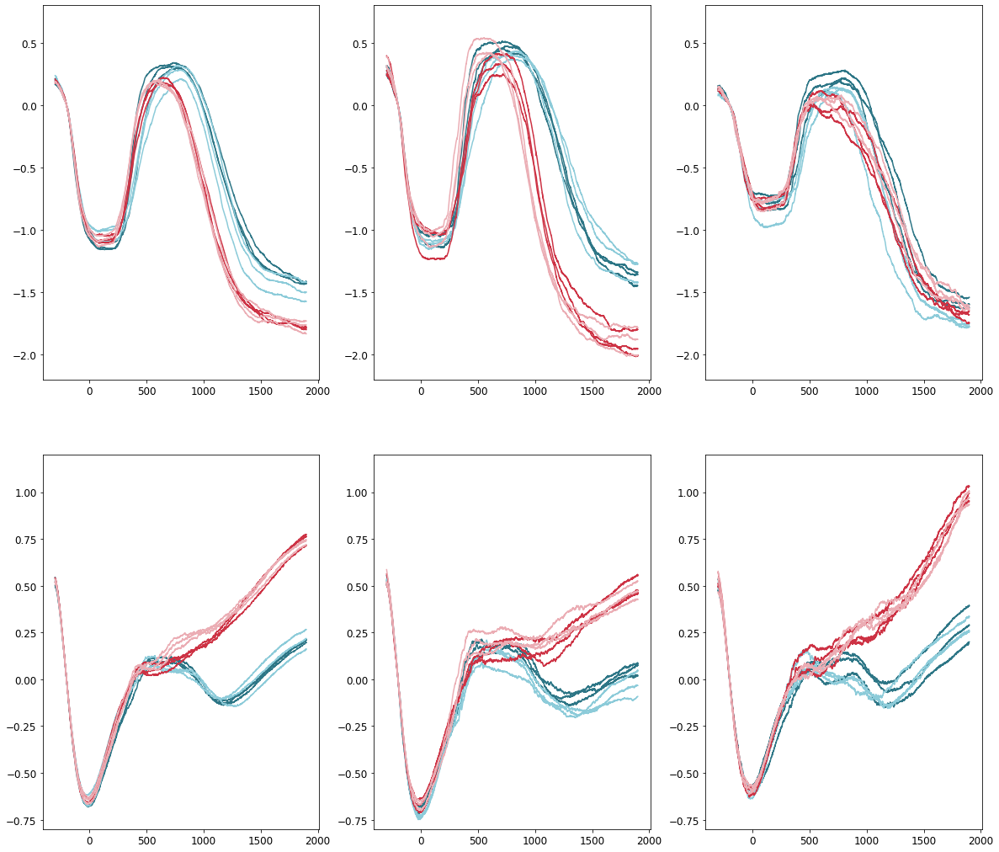

In [337]:
fig, ax =  plt.subplots(2, 3, figsize=(20, 18))

for ii, current_key in enumerate(all_data.keys()):
    
    for i in range(0, 3):
        ax[0, ii].plot(range(-300, TEST1-400), means_eye1[current_key][i], '#2d7686')
        #ax[0].fill_between(range(-300, TEST1), e1_means[i]-e1_sem[i], e1_means[i]+e1_sem[i], color = '#2d7686', lw = 1., alpha = 0.5, zorder=20)
        ax[1, ii].plot(range(-300, TEST1-400), means_eye2[current_key][i], '#2d7686')

    for i in range(3, 6):
        ax[0, ii].plot(range(-300, TEST1-400), means_eye1[current_key][i], '#8ccbd9')
        #ax[0].fill_between(range(-300, TEST1), e1_means[i]-e1_sem[i], e1_means[i]+e1_sem[i], color = '#8ccbd9', lw = 1., alpha = 0.5, zorder=20)
        ax[1, ii].plot(range(-300, TEST1-400), means_eye2[current_key][i], '#8ccbd9')

    for i in range(6, 9):
        ax[0, ii].plot(range(-300, TEST1-400), means_eye1[current_key][i], '#cd3244')
        #ax[0].fill_between(range(-300, TEST1), e1_means[i]-e1_sem[i], e1_means[i]+e1_sem[i], color = '#cd3244', lw = 1., alpha = 0.5, zorder=20)
        ax[1, ii].plot(range(-300, TEST1-400), means_eye2[current_key][i], '#cd3244')

    for i in range(9, 12):
        ax[0, ii].plot(range(-300, TEST1-400), means_eye1[current_key][i], color = '#ebadb4')
        #ax[0].fill_between(range(-300, TEST1), e1_means[i]-e1_sem[i], e1_means[i]+e1_sem[i], color = '#ebadb4', lw = 1., alpha = 0.5, zorder=20)
        ax[1, ii].plot(range(-300, TEST1-400), means_eye2[current_key][i], color = '#ebadb4')    

    ax[0, ii].set_ylim(-2.2, 0.8)
    ax[1, ii].set_ylim(-0.8,1.2)
    
    #ax[0, ii].set_xlim(-300, TEST1-200)
    #ax[1, ii].set_xlim(-300, TEST1-200)

for i in save_filetype:
    savepath = 'E:\\two_boundary\\figures\\eye_movements\\' + monkey + '_' + file[8:18] + '.' + i
    #fig.savefig(savepath, bbox_inches='tight')

In [320]:
file

'stanton_20201113_1_merged_w_ratings.mat'

In [378]:
errors = bhv[0][0][0][0]["TrialError"]
corr_trials = np.where(errors == 0)[0]
corr_trials

array([  2,   3,   4,   5,   6,   7,  10,  13,  14,  15,  16,  17,  20,
        21,  22,  23,  25,  26,  28,  31,  32,  34,  37,  38,  39,  40,
        41,  42,  43,  45,  47,  55,  56,  58,  61,  63,  64,  65,  66,
        67,  68,  69,  74,  75,  76,  77,  78,  79,  80,  81,  83,  84,
        85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,  96,  97,
        98,  99, 100, 101, 102, 103, 104, 105, 107, 108, 109, 110, 112,
       113, 114, 115, 116, 117, 118, 120, 121, 122, 123, 124, 131, 133,
       136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 149, 152,
       153, 154, 155, 156, 157, 158, 159, 160, 162, 163, 165, 166, 168,
       169, 170, 171, 173, 174, 175, 176, 177, 179, 180, 181, 182, 189,
       191, 193, 195, 196, 197, 198, 199, 200, 203, 204, 206, 207, 208,
       210, 211, 213, 214, 216, 218, 220, 222, 224, 226, 227, 229, 230,
       231, 234, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246,
       247, 248, 250, 251, 252, 253, 254, 256, 258, 260, 261, 26

In [306]:
tmp = np.dtype(neuro[0][0][0][0])
tmp['eye1']

NameError: name 'exists' is not defined

In [361]:
file

'stanton_20200722_1_merged_w_ratings.mat'

In [310]:
hasattr(tmp, 'eye2')

False

In [308]:
if tmp['eye3']:
    print('hi')

KeyError: "Field named 'eye3' not found."

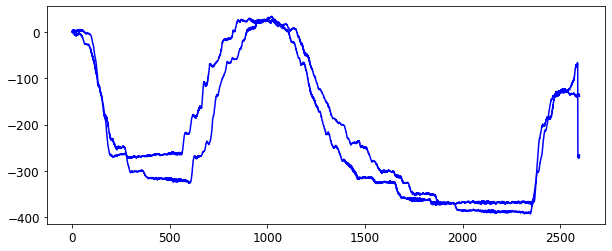

In [279]:
plt.plot(np.mean(eye1_by_trial[0], 0), 'b')
plt.plot(np.mean(eye1_by_trial[1], 0), 'b')

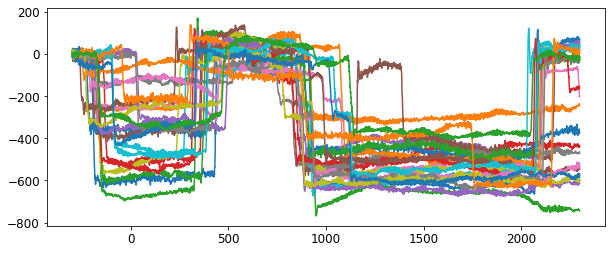

In [280]:
for i in range(len(eye1_by_trial[10])):
    plt.plot(range(-300, TEST1), eye1_by_trial[10][i])

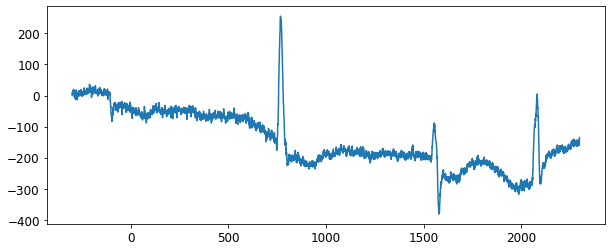

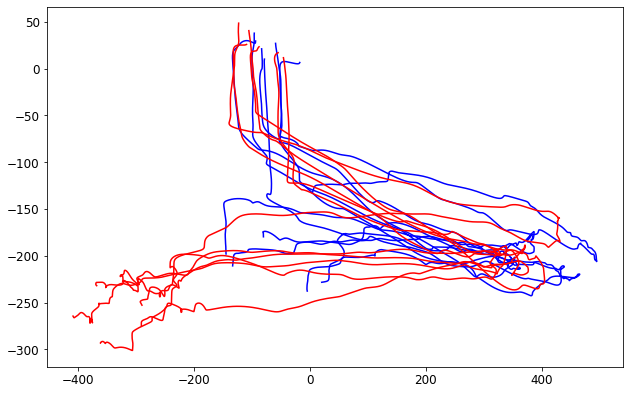

In [335]:
fig = plt.figure(figsize=(8, 5))
ax = fig.add_axes([1,1,1,1])
    
for i in range(6):
    ax.plot(e1_means[i][300:2000], e2_means[i][300:2000], 'b')
    
    
for i in range(6, 12):
    ax.plot(e1_means[i][300:2000], e2_means[i][300:2000], 'r')

In [95]:
savepath = 'E:\\two_boundary\\figures\\eye_movements\\' + monkey + '_' + file[8:18] + '_decoder.mat'
sp.io.savemat(savepath, {'perf_all': perf_all})

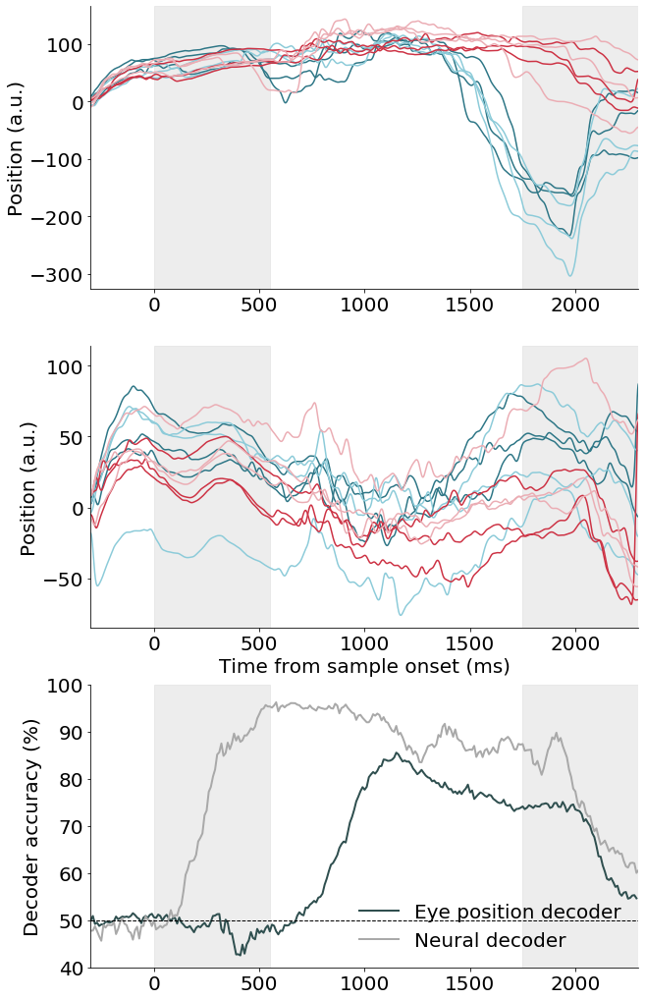

In [228]:
fig, ax =  plt.subplots(3, 1, figsize=(10, 18))
    
for i in range(0, 3):
    ax[0].plot(range(-300, TEST1), e1_means[i], '#2d7686')
    #ax[0].fill_between(range(-300, TEST1), e1_means[i]-e1_sem[i], e1_means[i]+e1_sem[i], color = '#2d7686', lw = 1., alpha = 0.5, zorder=20)
    ax[1].plot(range(-300, TEST1), e2_means[i], '#2d7686')
    
for i in range(3, 6):
    ax[0].plot(range(-300, TEST1), e1_means[i], '#8ccbd9')
    #ax[0].fill_between(range(-300, TEST1), e1_means[i]-e1_sem[i], e1_means[i]+e1_sem[i], color = '#8ccbd9', lw = 1., alpha = 0.5, zorder=20)
    ax[1].plot(range(-300, TEST1), e2_means[i], '#8ccbd9')
    
for i in range(6, 9):
    ax[0].plot(range(-300, TEST1), e1_means[i], '#cd3244')
    #ax[0].fill_between(range(-300, TEST1), e1_means[i]-e1_sem[i], e1_means[i]+e1_sem[i], color = '#cd3244', lw = 1., alpha = 0.5, zorder=20)
    ax[1].plot(range(-300, TEST1), e2_means[i], '#cd3244')
    
for i in range(9, 12):
    ax[0].plot(range(-300, TEST1), e1_means[i], color = '#ebadb4')
    #ax[0].fill_between(range(-300, TEST1), e1_means[i]-e1_sem[i], e1_means[i]+e1_sem[i], color = '#ebadb4', lw = 1., alpha = 0.5, zorder=20)
    ax[1].plot(range(-300, TEST1), e2_means[i], color = '#ebadb4')    
    
#ax[0].set_title('Y position', fontsize = 25, fontweight='bold')
#ax[1].set_title('X position', fontsize = 25, fontweight='bold')


ax[2].plot(np.arange(-300, TEST1, 10), np.mean(perf_all[0:40], 0), color = 'darkslategrey', lw = 2, label = 'Eye position decoder')
ax[2].plot(np.arange(-500, 3050, 10), neural_decoder, 'darkgray', lw = 2, label = 'Neural decoder')
ax[2].legend(frameon = False, fontsize = 20)
ax[2].plot([-500, 3050], [50, 50], '--k', lw = 1)


for i in range(3):
    ax[i].set_xlim((-300, TEST1))

    ax[1].set_xlabel('Time from sample onset (ms)', fontsize = 20)
    ax[i].set_ylabel('Position (a.u.)', fontsize = 20)

    ax[i].axvspan(0, TRIAL_EPOCHS[0], alpha = 0.4, color = 'lightgrey', zorder=1)
    ax[i].axvspan(TRIAL_EPOCHS[1], TRIAL_EPOCHS[2], alpha = 0.4, color = 'lightgrey', zorder=2)
    

    # Hide the right and top spines
    ax[i].spines['right'].set_visible(False)
    ax[i].spines['top'].set_visible(False)

    ax[i].tick_params(labelsize=20)

ax[2].set_ylabel('Decoder accuracy (%)', fontsize = 20)
ax[2].set_ylim(40, 100)

for i in save_filetype:
    savepath = 'E:\\two_boundary\\figures\\eye_movements\\' + monkey + '_' + file[8:18] + '.' + i
    #fig.savefig(savepath, bbox_inches='tight')

In [5]:
os.chdir('E:\\two_boundary\\all_beh_data')

In [6]:
data = sio.loadmat('stanton_all.mat')

In [10]:
i_theta

0

In [14]:
fig, ax =  plt.subplots(3, 1, figsize=(10, 18))

for i_theta in range(1):

    for i_dir in range(6):
        ax[i_theta].plot(np.mean(data['all_eye_1'][i_dir][[i_theta]], 0), np.mean(data['all_eye_2'][i_dir][[i_theta]], 0), plot_colors['Category1'])

    for i_dir in range(6, 12):
        ax[i_theta].plot(np.mean(data['all_eye_1'][i_dir][[i_theta]], 0), np.mean(data['all_eye_2'][i_dir][[i_theta]], 0), plot_colors['Category2'])

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x000001FBCC236598> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x000001FBCC247048> (for post_execute):


KeyboardInterrupt: 

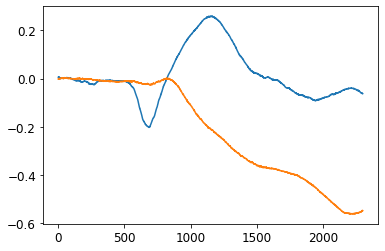

In [59]:
i_theta = 1

all_cat1 = np.mean([np.mean(data['all_eye_1'][i_dir][i_theta], 0) - np.mean(data['all_eye_1'][i_dir][i_theta][:, 100]) for i_dir in range(6)], 0)
all_cat2 = np.mean([np.mean(data['all_eye_1'][i_dir][i_theta], 0) - np.mean(data['all_eye_1'][i_dir][i_theta][:, 100]) for i_dir in range(6, 12)], 0)

plt.plot(all_cat1-all_cat2)


all_cat1 = np.mean([np.mean(data['all_eye_2'][i_dir][i_theta], 0) - np.mean(data['all_eye_2'][i_dir][i_theta][:, 100]) for i_dir in range(6)], 0)
all_cat2 = np.mean([np.mean(data['all_eye_2'][i_dir][i_theta], 0) - np.mean(data['all_eye_2'][i_dir][i_theta][:, 100]) for i_dir in range(6, 12)], 0)

plt.plot(all_cat1-all_cat2)

In [63]:
theta_vals = ['180', '150', '210']

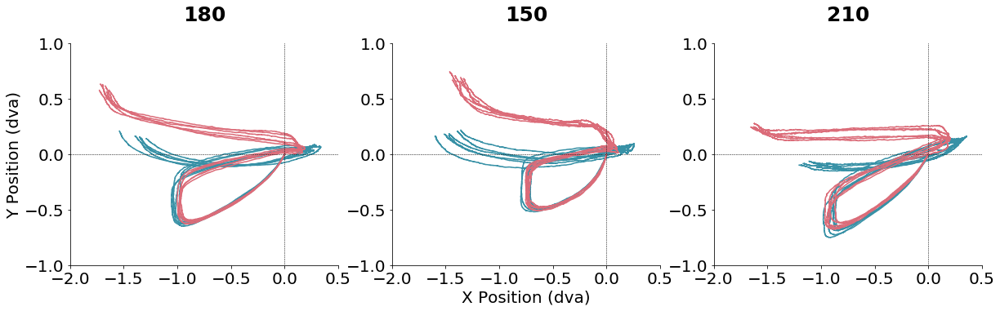

In [65]:
fig, ax =  plt.subplots(1, 3, figsize=(20, 5))

for i_theta in range(3):
    
    ax[i_theta].plot([0, 0], [-2, 2], '--k', lw = 0.5, zorder = 200)
    ax[i_theta].plot([-2, 2], [0, 0], '--k', lw = 0.5, zorder = 200)

    for i_dir in range(6):   
        eye1 = np.mean(data['all_eye_1'][i_dir][i_theta], 0) - np.mean(data['all_eye_1'][i_dir][i_theta][:, 100])
        eye2 = np.mean(data['all_eye_2'][i_dir][i_theta], 0) - np.mean(data['all_eye_2'][i_dir][i_theta][:, 100])
        ax[i_theta].plot(eye1[100:-250], eye2[100:-250], plot_colors['Category1'])

    for i_dir in range(6, 12):
        eye1 = np.mean(data['all_eye_1'][i_dir][i_theta], 0) - np.mean(data['all_eye_1'][i_dir][i_theta][:, 100])
        eye2 = np.mean(data['all_eye_2'][i_dir][i_theta], 0) - np.mean(data['all_eye_2'][i_dir][i_theta][:, 100])
        ax[i_theta].plot(eye1[100:-250], eye2[100:-250], plot_colors['Category2'])        
        
    ax[i_theta].set_ylim(-1, 1)
    ax[i_theta].set_xlim(-2, 0.5)
    
    ax[i_theta].set_title(theta_vals[i_theta], fontsize = 25, y = 1.08, fontweight='bold')
    
    ax[1].set_xlabel('X Position (dva)', fontsize = 20)
    ax[0].set_ylabel('Y Position (dva)', fontsize = 20)
    

    # Hide the right and top spines
    ax[i_theta].spines['right'].set_visible(False)
    ax[i_theta].spines['top'].set_visible(False)

    ax[i_theta].tick_params(labelsize=20)
    
    

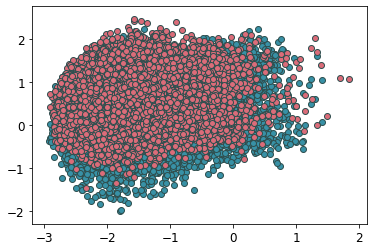

In [13]:
for i_dir in range(6):
    plt.scatter(data['all_eye_1'][i_dir][2][:, -1], data['all_eye_2'][i_dir][2][:, -1], edgecolor = 'darkslategrey', facecolor = plot_colors['Category1'])
    
for i_dir in range(6, 12):
    plt.scatter(data['all_eye_1'][i_dir][2][:, -1], data['all_eye_2'][i_dir][2][:, -1], edgecolor = 'darkslategrey', facecolor = plot_colors['Category2'])


(array([  6.,  17.,  59., 110., 221., 253., 273., 267., 121.,  19.]),
 array([-2.0060392 , -1.60289769, -1.19975619, -0.79661468, -0.39347317,
         0.00966833,  0.41280984,  0.81595134,  1.21909285,  1.62223435,
         2.02537586]),
 <a list of 10 Patch objects>)

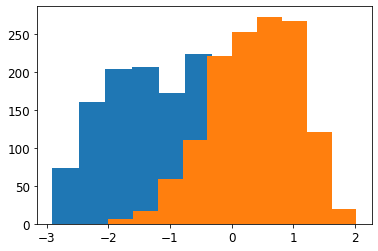

In [12]:
plt.hist(data['all_eye_1'][i_dir][2][:, -1])
plt.hist(data['all_eye_2'][i_dir][2][:, -1])

# Analysis on BHV data

In [230]:
monkey = 'Stanton'
datapath = 'E:\\two_boundary\\all_beh_data\\'

In [209]:
13

'20190814_neville_two_boundary_COMB.mat'

In [226]:
np.where(np.array(filelist) == file)

(array([257], dtype=int64),)

In [ ]:
all_data = {}

currpath = datapath + monkey + '\\' + 'mat\\'
os.chdir(currpath)

filelist = [f for f in glob.glob("*_COMB.mat")]
n_files = len(filelist)

# Loop over files (datasets)
for file in filelist:
    bhv = sio.loadmat(file)['data']
    conditions = [i[0][0] for i in bhv['Condition'][0]]
    errors = np.array([i[0][0] for i in bhv['TrialError'][0]])
    correct_trials = np.where(errors == 0)
    n_trials = len(errors)
    theta_vals = [bhv['VariableChanges'][0][i][0]['theta'][0][0][0] for i in range(n_trials)]
    
    unique_theta = np.unique(theta_vals)

    for theta in unique_theta:
        
        eye1_by_trial = [[] for i in range(N_DIRS)]
        eye2_by_trial = [[] for i in range(N_DIRS)]
        
        curr_trials = np.where(theta_vals == theta)[0]
        curr_trials_corr = np.intersect1d(curr_trials, correct_trials) 
        
        if len(curr_trials_corr) > 80:
        
            curr_errors = errors[curr_trials]
            beh_perf = sum(curr_errors == 0)/(sum(curr_errors == 0) + sum (curr_errors == 6) + sum (curr_errors == 5))*100

            for i_trial in curr_trials_corr:

                condition_num = conditions[i_trial]
                dir_num = int(np.ceil(condition_num/6))-1

                if condition_num < 73 and condition_num != PV_COND and bhv['BehavioralCodes'][0][1]['CodeNumbers'][0][0][1][0] != MS_STIM_ON:

                    eye1 = [i[0] for i in bhv['AnalogData'][0][i_trial][0]['Eye'][0]]
                    eye2 = [i[1] for i in bhv['AnalogData'][0][i_trial][0]['Eye'][0]]

                    code_nums = np.array([i[0] for i in bhv['BehavioralCodes'][0][i_trial]['CodeNumbers'][0][0]])
                    code_times = np.array([i[0] for i in bhv['BehavioralCodes'][0][i_trial]['CodeTimes'][0][0]])

                    samp_on_time = int(round(code_times[np.where(code_nums == STIM_ON)[0][0]]))

                    e1 = eye1[samp_on_time-200:samp_on_time+DELAY1+200]
                    e2 = eye2[samp_on_time-200:samp_on_time+DELAY1+200]

                    e1 = [i-e1[0] for i in e1]
                    e2 = [i-e2[0] for i in e2]

                    eye1_by_trial[dir_num].append(e1)
                    eye2_by_trial[dir_num].append(e2)
                
                
        if min([len(i) for i in eye1_by_trial]) > 5:


            ## PLOTTING ##

            e1_means = [gaussian_filter1d(np.mean(i, 0), 10) for i in eye1_by_trial if len(i) > 0]
            e2_means = [gaussian_filter1d(np.mean(i, 0), 10) for i in eye2_by_trial if len(i) > 0]

            e1_sem = [gaussian_filter1d(sp.stats.sem(i, 0), 10) for i in eye1_by_trial if len(i) > 0]
            e2_sem = [gaussian_filter1d(sp.stats.sem(i, 0), 10) for i in eye2_by_trial if len(i) > 0]


            bins_plotting = range(-200, DELAY1+200)

            n_iter = 100
            decoder_type = 'cat'

            all_data = np.vstack([eye1_by_trial, eye2_by_trial])
            n_neurons_decoder = 2
            n_neurons_total = 2
            n_trials_per_dir = 15
            equal_n_per_dir = False

            clf = SVC(kernel='linear')

            timepoints = bins_plotting

            # Run decoder every 10ms
            n_timepoints = len(timepoints)-1
            decoder_timepoints = np.arange(0, n_timepoints, 10)
            bins_decoder = np.arange(timepoints[0], timepoints[-1], 10)

            # Number trials per class (category)
            n_dirs_per_class = 3
            n_trials_train = n_trials_per_dir*n_dirs_per_class

            # Define quadrants for training/testing (4 possible combinations)
            all_configs = {}
            all_configs['train_data_c1'] = [[0, 1, 2], [3, 4, 5], [0, 1, 2], [3, 4, 5]]
            all_configs['train_data_c2'] = [[6, 7, 8], [9, 10, 11], [9, 10, 11], [6, 7, 8]]
            all_configs['test_data_c1'] = [[3, 4, 5], [0, 1, 2], [3, 4, 5], [0, 1, 2]]
            all_configs['test_data_c2'] = [[9, 10, 11], [6, 7, 8], [6, 7, 8], [9, 10, 11]]
            groups = ['train_data_c1', 'train_data_c2', 'test_data_c1', 'test_data_c2']

            # Pre-allocate to save decoder performance
            perf_all = np.zeros([n_iter, len(decoder_timepoints)])

            for iteration in range(0, n_iter):

                # Choose subset of neurons (if sub-sampling)
                neurons = np.random.choice(n_neurons_total, n_neurons_decoder, replace=False)

                # Choose a train-test config
                indx = np.random.randint(0, 4)
                curr_config = {}
                for ii, group in enumerate(groups):
                    curr_config[group] = all_configs[group][indx]

                # Pre-allocate training and testing arrays
                svm_data = {}
                for group in groups:
                    svm_data[group] = [np.zeros([n_neurons_decoder, n_trials_train]) for i in range(n_timepoints)]

                for i_neuron, neuron in enumerate(neurons):
                    data = all_data[neuron]

                     # Organize neuron's data by category and training/testing trials
                    for group in groups:

                        if equal_n_per_dir:
                            min_nt = min([len(i) for i in [data[curr_config[group][0]], data[curr_config[group][1]], data[curr_config[group][2]]]])

                            if min_nt >= n_trials_per_dir:
                                inds = np.vstack([np.random.choice(len(data[ii]), n_trials_per_dir, replace= False) for ii in curr_config[group]])
                            else:
                                inds = np.vstack([np.random.choice(len(data[i]), n_trials_per_dir, replace= False) if len(data[i]) >= n_trials_per_dir else np.random.choice(len(data[i]), n_trials_per_dir, replace= True) for i in curr_config[group]])

                            X = np.vstack([data[val][inds[i]] for i, val in enumerate(curr_config[group])])

                        else:
                            curr_data = np.vstack([data[curr_config[group][0]], data[curr_config[group][1]], data[curr_config[group][2]]])
                            X, Xt, y, yt = train_test_split(curr_data, np.zeros([len(curr_data)]), train_size = n_trials_train)

                        if n_timepoints == 1:
                            svm_data[group][0][i_neuron][:] = np.hstack(X)
                        else:
                            for ii in range(n_timepoints):
                                svm_data[group][ii][i_neuron][:] = X[:, ii]

                # Run decoder
                perf = np.ones([len(decoder_timepoints)])

                for i_timepoint, timepoint in enumerate(decoder_timepoints):

                    x_train = np.hstack([svm_data['train_data_c1'][timepoint], svm_data['train_data_c2'][timepoint]])
                    y_train = np.hstack([np.zeros([n_trials_train]), np.ones([n_trials_train])])

                    x_test = np.hstack([svm_data['test_data_c1'][timepoint], svm_data['test_data_c2'][timepoint]])
                    y_test = np.hstack([np.zeros([n_trials_train]), np.ones([n_trials_train])])

                    clf.fit(x_train.T, y_train)

                    pred = clf.predict(x_test.T)
                    perf[i_timepoint] = sum(pred == y_test)/len(y_test)*100

                perf_all[iteration] = perf



            savepath = figpath + 'eye_movements\\' + monkey + '\\by_session\\' + file[0:8] + '_theta_' + str(theta) + '.mat'
            sp.io.savemat(savepath, {'perf_all': perf_all, 'e1_means': e1_means, 'e2_means': e2_means, 'eye1_by_trial': eye1_by_trial, 'eye2_by_trial': eye2_by_trial, 'beh_perf': beh_perf})


            fig, ax =  plt.subplots(3, 2, figsize=(20, 25))
            gs = fig.add_gridspec(3,2)
            #ax[0, 0] = fig.add_subplot(gs[0, 0])
            #ax[1, 0] = fig.add_subplot(gs[1, 0])
            #ax[0, 1] = fig.add_subplot(gs[0, 1])
            #ax[1, 1] = fig.add_subplot(gs[1, 1])
            ax2 = fig.add_subplot(gs[2, :])

            for i in range(2):
                ax[2, i].set_xticks([])
                ax[2, i].set_yticks([])


            colors = ['#2d7686', '#2d7686', '#2d7686', '#8ccbd9', '#8ccbd9', '#8ccbd9', '#cd3244', '#cd3244', '#cd3244', '#ebadb4', '#ebadb4', '#ebadb4',]

            for i in range(N_DIRS):
                ax[0, 0].plot(bins_plotting, e1_means[i], color = colors[i])
                #ax[0].fill_between(bins_plotting, e1_means[i]-e1_sem[i], e1_means[i]+e1_sem[i], color = '#2d7686', lw = 1., alpha = 0.5, zorder=20)
                ax[1, 0].plot(bins_plotting, e2_means[i], color = colors[i])
                ax[0, 1].plot(e1_means[i], e2_means[i], color = colors[i])

                x = np.array([gaussian_filter1d(ii, 10)[-200] for ii in eye1_by_trial[i] if len(ii) > 0])
                y = np.array([gaussian_filter1d(ii, 10)[-200] for ii in eye2_by_trial[i] if len(ii) > 0])
                ax[1, 1].plot(x, y, '.', color = colors[i])
                #ax.scatter(x, y, s=0.5)

                confidence_ellipse(x, y, ax[1, 1], n_std=2.0, edgecolor= colors[i])

            for i in range(2):
                ax[i, 0].set_ylabel('Eye position (dva)', fontsize = 16)
                ax[i, 0].set_xlabel('Time from stimulus onset (ms)', fontsize = 16)
                ax[i, 0].set_xlim((-200, DELAY1+200))
                ax[i, 0].axvspan(0, TRIAL_EPOCHS[0], alpha = 0.4, color = 'lightgrey', zorder=1)
                ax[i, 0].axvspan(TRIAL_EPOCHS[1], TRIAL_EPOCHS[2], alpha = 0.4, color = 'lightgrey', zorder=2)

            for i in range(2):
                ax[i, 1].set_ylabel('Y position (dva)', fontsize = 16)
                ax[i, 1].set_xlabel('X position (dva)', fontsize = 16)   
                ax[i, 1].axvline(c='grey', lw=1)
                ax[i, 1].axhline(c='grey', lw=1)


            ax[0, 0].set_title('Mean X position over trial', fontsize = 25, fontweight='bold')
            ax[1, 0].set_title('Mean Y position over trial', fontsize = 25, fontweight='bold')
            ax[0, 1].set_title('Mean X vs Y position', fontsize = 25, fontweight='bold')
            ax[1, 1].set_title('Eye position at end of delay', fontsize = 25, fontweight='bold')
            ax2.set_title('Category decoding', fontsize = 25, fontweight='bold')
            fig.suptitle('Accuracy: {:.2f}%, Stimulus theta: {}\u00b0, # Trials: {}'.format(beh_perf, theta, len(curr_trials_corr)), fontsize = 30, fontweight='bold')

            ax2.plot(bins_decoder, np.mean(perf_all, 0), color = 'darkslategrey', label = 'Eye position decoder')
            ax2.fill_between(bins_decoder, np.mean(perf_all, 0)-np.std(perf_all, 0), np.mean(perf_all, 0)+np.std(perf_all, 0), color = 'darkslategrey', lw = 1., alpha = 0.5, zorder=20)
            ax2.plot(np.arange(-500, 3050, 10), neural_decoder['decoder_mean'][0][0], 'darkgray', lw = 2, label = 'SC category decoder')
            ax2.fill_between(np.arange(-500, 3050, 10), neural_decoder['decoder_mean'][0][0]-neural_decoder['decoder_std'][0][0], neural_decoder['decoder_mean'][0][0]+neural_decoder['decoder_std'][0][0], color = 'darkgray', lw = 1., alpha = 0.5, zorder=20)
            ax2.plot([-500, 3050], [50, 50], '--k', lw = 1)

            ax2.axvspan(0, TRIAL_EPOCHS[0], alpha = 0.4, color = 'lightgrey', zorder=1)
            ax2.axvspan(TRIAL_EPOCHS[1], TRIAL_EPOCHS[2], alpha = 0.4, color = 'lightgrey', zorder=2)

            ax2.legend(frameon = False, fontsize = 20)

            ax2.set_xlim(-100, DELAY1+200)
            ax2.set_ylim(30, 100)

            ax2.set_xlabel('Time from stimulus onset (ms)', fontsize = 16)

            ax2.spines['right'].set_visible(False)
            ax2.spines['top'].set_visible(False)
            ax2.tick_params(labelsize=16)
            

            for i in range(2):
                for j in range(2):
                    ax[i, j].spines['right'].set_visible(False)
                    ax[i, j].spines['top'].set_visible(False)
                    ax[i, j].tick_params(labelsize=16)

            
            for i in save_filetype:
                savename = figpath + 'eye_movements\\' + monkey + '\\by_session\\' + file[0:8] + '_theta_' + str(theta) + '.' + i
                fig.savefig(savename, bbox_inches='tight')


In [225]:
np.shape(curr_data)

(42, 2150)

In [142]:
beh_perf = sum(errors == 0)/(sum(errors == 0) + sum (errors == 6) + sum (errors == 5))*100

Text(0.5, 0.98, 'Accuracy: 66.18%, Stimulus theta: 239°')

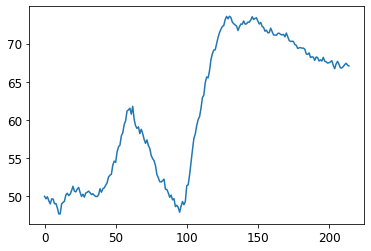

In [136]:
plt.plot(np.mean(perf_all, 0))